In [1]:
#fundamentals
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

# maps and visualiz
import folium
from folium import plugins
import branca
import seaborn as sns

#machine learning
from pylab import rcParams
from sklearn.metrics import confusion_matrix
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn import svm
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.metrics import jaccard_score
from sklearn.metrics import f1_score
from sklearn.metrics import log_loss


#from sklearn import svm, datasets
# import nltk
# nltk.download("punkt")

In [2]:
cols = ['Severity', 
        'Weather_Condition', 'Precipitation(in)', 'Temperature(F)', 
        'Visibility(mi)', 'Sunrise_Sunset',
        'State', 'Street', 'Description', 
        'Start_Lat', 'Start_Lng', 
        'Traffic_Calming', 'Traffic_Signal', 
        'Start_Time', 'Zipcode']


# You can use the kaggle url instead if you want -  https://www.kaggle.com/sobhanmoosavi/us-accidents/download
df = pd.read_csv('C:\\Users\\rb974\\Coursera_Capstone\\archive\\US_Accidents_June20.csv', 
                 usecols=cols)
df.head(2)

,Severity,Start_Time,Start_Lat,Start_Lng,Description,Street,State,Zipcode,Temperature(F),Visibility(mi),Precipitation(in),Weather_Condition,Traffic_Calming,Traffic_Signal,Sunrise_Sunset
0,3,2016-02-08 05:46:00,39.865147,-84.058723,Right lane blocked due to accident on I-70 Eas...,I-70 E,OH,45424,36.9,10.0,0.02,Light Rain,False,False,Night
1,2,2016-02-08 06:07:59,39.928059,-82.831184,Accident on Brice Rd at Tussing Rd. Expect del...,Brice Rd,OH,43068-3402,37.9,10.0,0.00,Light Rain,False,False,Night


In [3]:
# get NaN counts and display for user
print('')
print('This will take some time. Beginning Cleaning.. ')
na_count = df.isna().sum()

# Date 
df['StartDateTime'] = pd.to_datetime(df['Start_Time'])
df['Date'] = [d.date() for d in df['StartDateTime']]
df['Time'] = [d.time() for d in df['StartDateTime']]

# Drop
df = df.dropna(subset=['Description', 'Sunrise_Sunset', 'Zipcode'])

# fillwith

df['Precipitation(in)'].fillna(0.0, inplace=True)
df['Temperature(F)'].fillna(df['Temperature(F)'].mean(), inplace=True) 
df['Visibility(mi)'].fillna(df['Visibility(mi)'].mean(), inplace=True)
df['Description'].fillna('unknown', inplace=True)
df['Weather_Condition'].fillna('unknown', inplace=True)

# get counts and display for user
na_count = df.isna().sum()
print(na_count)


# remove symbols
df['Zipcode'] = df['Zipcode'].str.replace('-\d\d\d\d','')
df["Description"] = df['Description'].str.replace('[-/""]',' ')

# rename a couple columns with poor convention
df = df.rename(columns={"Start_Lat": "Latitude", "Start_Lng": "Longitude", 
                        "Temperature(F)": "Temp", "Visibility(mi)": "VisibilityMile", 
                        "Precipitation(in)": "PrecipInch", "Weather_Condition": "Conditions"})
df_column_names = pd.DataFrame(list(df)) # a variable for reference as needed

# sort the table
df = df.sort_values(by=['Date','Time'], ascending=True)
print('')
#df.to_csv('C:\\Users\\rb974\\IBM_DS_Capstone\\archive\\US-Full-Clean-Shaped.csv', index=True)
df.head(1)


# Create a dataframe for Delaware
df_DE = df.loc[df['State'] == 'DE']

# create a few date/time series for use in time series viz if desired
first_year_series = pd.Series(
    pd.date_range("2016-01-01", periods=12, freq="M"))
#print(first_year_series)
second_year_series = pd.Series(
    pd.date_range("2017-01-01", periods=12, freq="M"))
#print(second_year_series)
third_year_series = pd.Series(
    pd.date_range("2018-01-01", periods=12, freq="M"))
#print(third_year_series)
fourth_year_series = pd.Series(
    pd.date_range("2019-01-01", periods=12, freq="M"))
#print(fourth_year_series)
fifth_year_series = pd.Series(
    pd.date_range("2020-01-01", periods=12, freq="M"))
#print(fifth_year_series)

# establish dataframes for each severity
df_DE_marginal = df_DE.loc[df_DE['Severity'] == 1]
df_DE_significant = df_DE.loc[df_DE['Severity'] == 2]
df_DE_severe = df_DE.loc[df_DE['Severity'] == 3]
df_DE_fatal = df_DE.loc[df_DE['Severity'] == 4]
df_DE_fatal_conditions = df_DE_fatal['Conditions'].value_counts().sort_values(ascending=False).head(10)

# sort the frame and set the index to a datetime object
df_DE = df_DE.sort_values(by=['StartDateTime'], ascending=True)
df_DE = df_DE.set_index('StartDateTime')

# (top 10) accidents by ...(top 10 except Severity)
accidents_DE_by_severity = df_DE['Severity'].value_counts().sort_values(ascending=False)
accidents_DE_by_month = df_DE.index.month.value_counts().sort_values(ascending=False)
accidents_DE_by_conditions = df_DE['Conditions'].value_counts().sort_values(ascending=False).head(10)
accidents_DE_by_street = df_DE['Street'].value_counts().head(20)
accidents_DE_by_zipcode = df_DE['Zipcode'].value_counts().head(10)
accidents_DE_by_year = df_DE.index.year.value_counts().head(10)
df_accidents_DE_by_year_a = df_DE[df_DE.index.year == 2016]
df_accidents_DE_by_year_b = df_DE[df_DE.index.year == 2017]
df_accidents_DE_by_year_c = df_DE[df_DE.index.year == 2018]
df_accidents_DE_by_year_d = df_DE[df_DE.index.year == 2019]
df_accidents_DE_by_year_e = df_DE[df_DE.index.year == 2020]

df_accidents_DE_by_month_march = df_DE[df_DE.index.month == 3]


#df_DE.to_csv('C:\\Users\\rb974\\Coursera_Capstone\\archive\\DE-Full-Clean-Shaped.csv', index=True)
print('done')


This will take some time. Beginning Cleaning.. 
Severity             0
Start_Time           0
Start_Lat            0
Start_Lng            0
Description          0
Street               0
State                0
Zipcode              0
Temperature(F)       0
Visibility(mi)       0
Precipitation(in)    0
Weather_Condition    0
Traffic_Calming      0
Traffic_Signal       0
Sunrise_Sunset       0
StartDateTime        0
Date                 0
Time                 0
dtype: int64

done


In [4]:
year_over_year = pd.DataFrame([df_accidents_DE_by_year_a['Severity'].count(), 
                               df_accidents_DE_by_year_b['Severity'].count(), 
                               df_accidents_DE_by_year_c['Severity'].count(), 
                               df_accidents_DE_by_year_d['Severity'].count(), 
                               df_accidents_DE_by_year_e['Severity'].count()
                              ], index=['2016','2017','2018','2019', '2020'])
year_over_year.columns = ['Accidents']


year_over_year

,Accidents
2016,279
2017,891
2018,1644
2019,1620
2020,1305


In [5]:
accidents_DE_by_zipcode

19720    821
19801    641
19805    553
19702    421
19709    404
19802    351
19701    307
19808    256
19703    234
19713    200
Name: Zipcode, dtype: int64

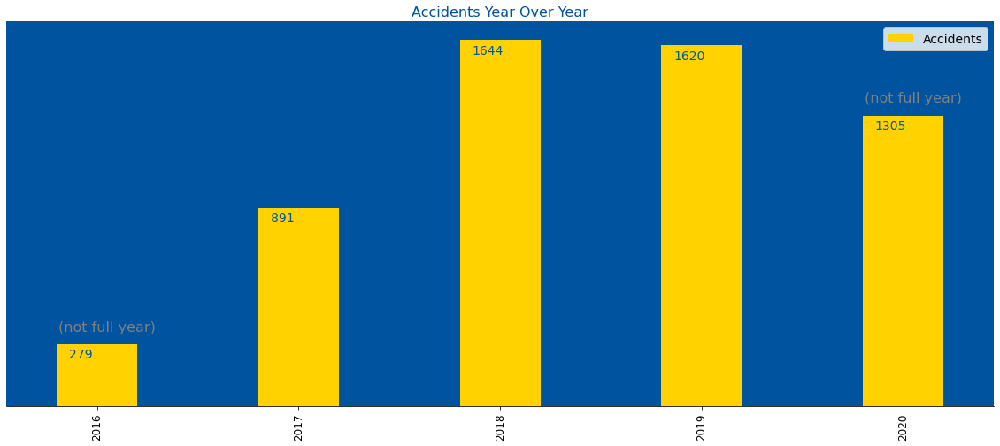

In [6]:
px1 = year_over_year.plot(kind = 'bar',
                figsize = (20,8),
                width = 0.4,
                color = ['#FFD200'],   
                fontsize = '12')
# DE Blue '#00539F'
# DE YELLOW '#FFD200'
# Beautify

px1.set_facecolor('#00539F')
px1.set_title("Accidents Year Over Year",color ='#00539F',  fontsize = 16)
px1.legend(fontsize = 14)
px1.spines['top'].set_visible(False)
px1.spines['right'].set_visible(False)
px1.spines['left'].set_visible(False)
px1.yaxis.set_visible(False)

# iterate the patches in the plot to annotate them with the percentage accident counts
for i in px1.patches:  
    px1.annotate("{:}".format(i.get_height()),
                xy=(i.get_x()+.06, i.get_height()-62.2), fontsize = 14, color='#00539F')
    if (i.get_x(), i.get_height()) == (-0.2, 279) or (i.get_x(), i.get_height()) == (3.8, 1305):
        px1.annotate('(not full year)'.format(i.get_height()), xy=((i.get_x()+.01, i.get_height()+60)), fontsize = 16, color = 'gray')
    #print((i.get_x(), i.get_height()))
    #print(px1.xaxis)
plt.savefig('accidents_year_over_year.png')
plt.show()

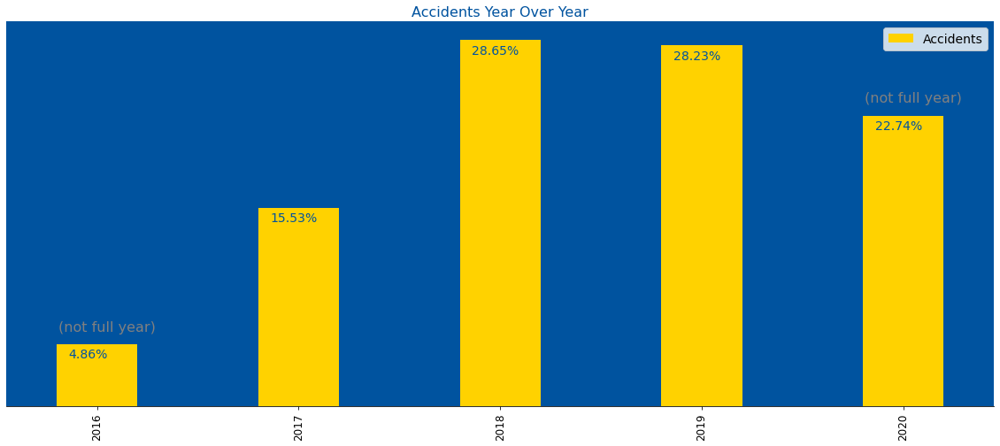

In [7]:
px1 = year_over_year.plot(kind = 'bar',
                figsize = (20,8),
                width = 0.4,
                color = ['#FFD200'],   
                fontsize = '12')
# DE Blue '#00539F'
# DE YELLOW '#FFD200'

px1.set_facecolor('#00539F')
px1.set_title("Accidents Year Over Year",color ='#00539F',  fontsize = 16)
px1.legend(fontsize = 14)
px1.spines['top'].set_visible(False)
px1.spines['right'].set_visible(False)
px1.spines['left'].set_visible(False)
px1.yaxis.set_visible(False)

# iterate the patches in the plot to annotate them with the percentage accident counts
for i in px1.patches:  
    px1.annotate("{:.2%}".format(i.get_height()/5738),
                xy=(i.get_x()+.06, (i.get_height()-62.2)), fontsize = 14, color='#00539F')
    if (i.get_x(), i.get_height()) == (-0.2, 279) or (i.get_x(), i.get_height()) == (3.8, 1305):
        px1.annotate('(not full year)'.format(i.get_height()), xy=((i.get_x()+.01, i.get_height()+60)), fontsize = 16, color = 'gray')
    #print((i.get_x(), i.get_height()))
    #print(px1.xaxis)
    #print(px1.xaxis)
plt.savefig('accidents_year_over_year_distr.png')
plt.show()

No handles with labels found to put in legend.


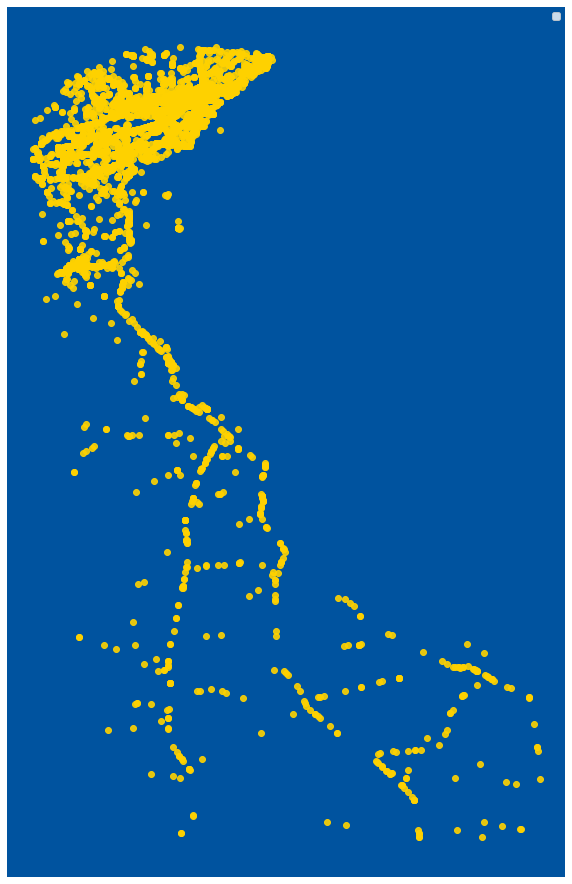

In [8]:
# PRODUCTION STATE SCATTERPLOT 
# experiment #5CFFD200 #7000539F blue
# DE Blue '#00539F'
# DE YELLOW '#FFD200'
xx = np.array(df_DE['Longitude'])
yy = np.array(df_DE['Latitude'])

fig, ax = plt.subplots(
    figsize=(10, 16),
    dpi=72)
               
for color in ['yellow']:
    #n = 750
    x, y = xx, yy
    #scale = 200.0 * np.random.rand(n)
    ax.scatter(x, y,
               #edgecolors='yellow',
               color = '#FFD200',
               alpha=0.9)
ax.spines['left'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.yaxis.set_visible(False)
ax.xaxis.set_visible(False)

ax.set_facecolor('#00539F')

ax.legend()
ax.grid(False)
# c=color, , edgecolors='white'
    #print(px1.xaxis)
plt.savefig('accidents_5739.png')
plt.show()

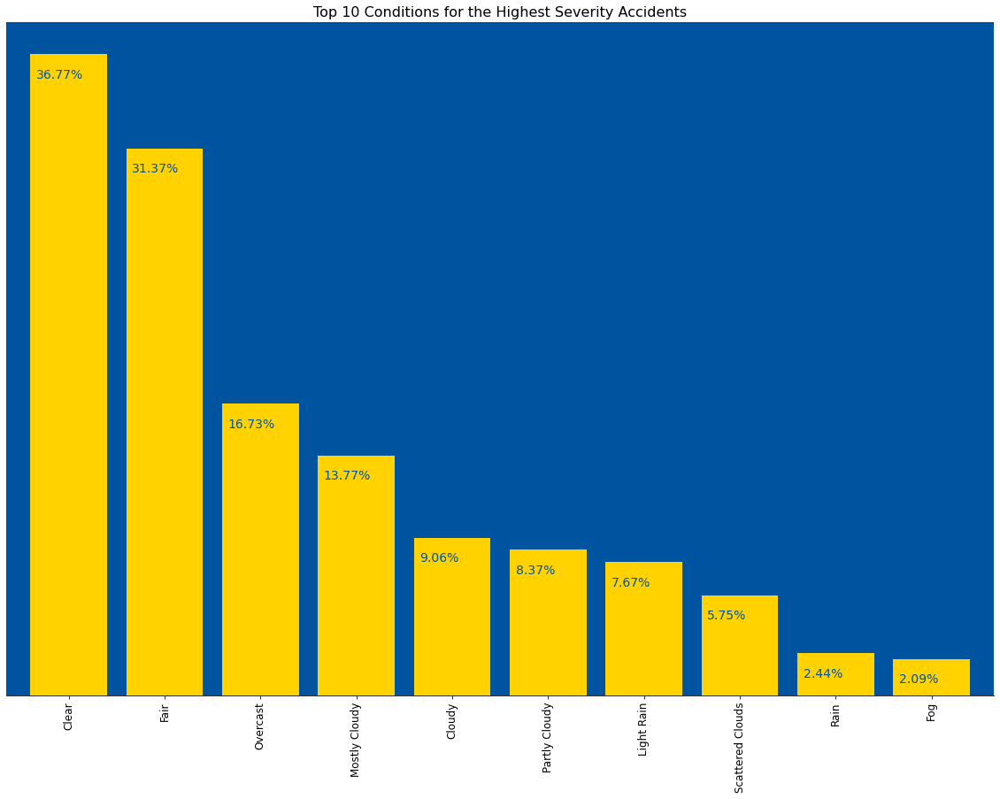

In [9]:
# PRODUCTION
# Plot the  chart
# DE Blue '#00539F'
# DE YELLOW '#FFD200'
px1 = df_DE_fatal_conditions.plot(kind = 'bar',
                figsize = (20,14),
                width = 0.8,
                color = ['#FFD200'],   
                fontsize = '12')
label = 'Accidents'
# Beautify
px1.set_facecolor('#00539F')  # #7000539F #00539F
px1.set_title("Top 10 Conditions for the Highest Severity Accidents", fontsize = 16)
#px1.legend(fontsize = 14)
#px1.legend(labels=label, loc='upper right')  # df_DE_fatal_conditions,
px1.spines['top'].set_visible(False)
px1.spines['right'].set_visible(False)
px1.spines['left'].set_visible(False)
px1.yaxis.set_visible(False)

# iterate the patches in the plot to annotate them with the percentage accident counts
for i in px1.patches:  
    px1.annotate("{:.2%}".format(i.get_height()*10/5738),
                xy=(i.get_x()+.06, i.get_height()-8.0), fontsize = 14, color='#00539F') 
    #print(px1.xaxis)
plt.savefig('accidents_topten_highest_severity.png')    
plt.show()



In [10]:
df_DE_fatal_conditions

Clear               211
Fair                180
Overcast             96
Mostly Cloudy        79
Cloudy               52
Partly Cloudy        48
Light Rain           44
Scattered Clouds     33
Rain                 14
Fog                  12
Name: Conditions, dtype: int64

In [11]:
#PRODUCTION - High Severity based map  - IT WONT RENDER if the value of "count" gets too high. around 1500 or below it still works : fixed

import folium
from folium import plugins
map_DE_fatal = folium.Map(location=[39.161453, -75.534553], zoom_start = 9, tiles='cartodbpositron')
popup_width = '200'
popup_height = '210'
accidents = plugins.MarkerCluster().add_to(map_DE_fatal)
runs = 0
for lat, lng, label1, label2, label3, label4 in zip(df_DE_fatal.Latitude, 
                                            df_DE_fatal.Longitude, df_DE_fatal.Street, 
                                            df_DE_fatal.PrecipInch, df_DE_fatal.Conditions,
                                            df_DE_fatal.Description):
    html_marginal = folium.Html(f'''<body style="color:gray;background-color:white">
                                    <h5 style="color:gray">Description:</h5><p><em> {label4}</em></p><br>\
                                    <h5 style="color:gray">Conditions:</h5><em> {label3}</em><br>\
                                    <h5 style="color:gray">Roadway:</h5>{label1}<br>\
                                    <h5 style="color:gray">Coordinates:</h5>{lat} {lng}<br>\
                                    </body>
                                    ''', script=True)
                                   
    iframe = branca.element.IFrame(html=html_marginal, width=popup_width, height=popup_height) 
    popup = folium.Popup(iframe, parse_html=True)
    folium.CircleMarker(location=[lat,lng], color='red', popup=popup).add_to(accidents)
    
    
    
    #label  = " " + label4 + 'Roadway ' + str(label1)+' Precip = ' + str(label2) + " Conditions " + str(label3) 
    #folium.Marker(
        #location=[lat, lng],
        #icon=None,
       # popup=label
   # ).add_to(accidents)
   # runs = runs+1
   # if runs == len(df_DE_fatal):
    #    break
        
        
# print(df_DE_fatal.Description)
print(len(df_DE_fatal.Description), 'High Severity accidents in the study')

map_DE_fatal.save("map_DE_highest_severity.html")
df_DE_fatal_conditions.head()
map_DE_fatal

812 High Severity accidents in the study


In [12]:
# PRODUCTIO MAP ALL SEVERITY
map_DE_severe = folium.Map(location=[39.161453, -75.534553], zoom_start = 9) #, tiles='cartodbpositron' # 'Stamen Toner'
accidents = plugins.MarkerCluster().add_to(map_DE_severe)
popup_width = '200'
popup_height = '210'


    
## NEW YELLOW BELOW HERE
print('starting first loop')
for lat, lng, label1, label2, label3, label4 in zip(df_DE_marginal.Latitude, 
                                            df_DE_marginal.Longitude, df_DE_marginal.Street, 
                                            df_DE_marginal.PrecipInch, df_DE_marginal.Conditions,
                                            df_DE_marginal.Description):
    
    html_marginal = folium.Html(f'''<body style="color:gray;background-color:white">
                                    <h5 style="color:gray">Description:</h5><p><em> {label4}</em></p><br>\
                                    <h5 style="color:gray">Conditions:</h5><em> {label3}</em><br>\
                                    <h5 style="color:gray">Roadway:</h5>{label1}<br>\
                                    <h5 style="color:gray">Coordinates:</h5>{lat} {lng}<br>\
                                    </body>
                                    ''', script=True)
                                   
    iframe = branca.element.IFrame(html=html_marginal, width=popup_width, height=popup_height) 
    popup = folium.Popup(iframe, parse_html=True)
    folium.CircleMarker(location=[lat,lng], color='yellow', popup=popup).add_to(accidents)
    
    

print('starting second loop')
for lat, lng, label1, label2, label3, label4 in zip(df_DE_significant.Latitude, 
                                            df_DE_significant.Longitude, df_DE_significant.Street, 
                                            df_DE_significant.PrecipInch, df_DE_significant.Conditions,
                                            df_DE_significant.Description):
    
    html_significant = folium.Html(f'''<body style="color:gray;background-color:white">
                                    <h5 style="color:gray">Description:</h5><p><em> {label4}</em></p><br>\
                                    <h5 style="color:gray">Conditions:</h5><em> {label3}</em><br>\
                                    <h5 style="color:gray">Roadway:</h5>{label1}<br>\
                                    <h5 style="color:gray">Coordinates:</h5>{lat} {lng}<br>\
                                    </body>
                                    ''', script=True)
    iframe = branca.element.IFrame(html=html_significant, width=popup_width, height=popup_height) 
    popup = folium.Popup(iframe, parse_html=True)
    folium.CircleMarker(location=[lat,lng], color='blue', popup=popup).add_to(accidents)

    
    
                                
print('starting third loop')
for lat, lng, label1, label2, label3, label4 in zip(df_DE_severe.Latitude, 
                                            df_DE_severe.Longitude, df_DE_severe.Street, 
                                            df_DE_severe.PrecipInch, df_DE_severe.Conditions,
                                            df_DE_severe.Description):
    
    html_severe = folium.Html(f'''<body style="color:gray;background-color:white">
                                    <h5 style="color:gray">Description:</h5><p><em> {label4}</em></p><br>\
                                    <h5 style="color:gray">Conditions:</h5><em> {label3}</em><br>\
                                    <h5 style="color:gray">Roadway:</h5>{label1}<br>\
                                    <h5 style="color:gray">Coordinates:</h5>{lat} {lng}<br>\
                                    </body>
                                    ''', script=True)
    
    iframe = branca.element.IFrame(html=html_severe, width=popup_width, height=popup_height) 
    popup = folium.Popup(iframe, parse_html=True)
    folium.CircleMarker(location=[lat,lng], color='green', popup=popup).add_to(accidents)
                              
                              
                              
                              
print('starting fourth loop')    
for lat, lng, label1, label2, label3, label4 in zip(df_DE_fatal.Latitude, 
                                            df_DE_fatal.Longitude, df_DE_fatal.Street, 
                                            df_DE_fatal.PrecipInch, df_DE_fatal.Conditions,
                                            df_DE_fatal.Description):
    
    test_fatal = folium.Html(f'''<body style="color:gray;background-color:white">
                                    <h5 style="color:gray">Description:</h5><p><em> {label4}</em></p><br>\
                                    <h5 style="color:gray">Conditions:</h5><em> {label3}</em><br>\
                                    <h5 style="color:gray">Roadway:</h5>{label1}<br>\
                                    <h5 style="color:gray">Coordinates:</h5>{lat} {lng}<br>\
                                    </body>
                                    ''', script=True) 
    
    iframe = branca.element.IFrame(html=test_fatal, width=popup_width, height=popup_height) 
    popup = folium.Popup(iframe, parse_html=True)
    folium.CircleMarker(location=[lat,lng], color='red', popup=popup).add_to(accidents)
    
print(len(df_DE.Description), 'Total accidents in the study')    
print('saving the new map to \\"map_DE_all_accidents.html"\\')
map_DE_severe.save("map_DE_all_accidents.html")
#print('finished saving...loading map')
map_DE_severe

starting first loop
starting second loop
starting third loop
starting fourth loop
5739 Total accidents in the study
saving the new map to \"map_DE_all_accidents.html"\


In [13]:
accidents_each_day = [df_DE['Date'].value_counts()] 
accidents_each_day = pd.DataFrame(accidents_each_day).transpose()
accidents_each_day.reset_index(inplace=True)
accidents_each_day.columns = ['Date', 'Accidents']
accidents_each_day.fillna(0.0, inplace=True)
accidents_each_day.head()

,Date,Accidents
0,2020-04-24,29
1,2020-03-18,28
2,2020-05-11,26
3,2020-03-27,26
4,2020-03-20,25


In [14]:
# PRODUCTION feature shaping for ml

df_DE_severity_onehot = pd.get_dummies(df_DE['Severity'])
df_DE_onehot = pd.get_dummies(df_DE['Conditions'])

df_DE_encoded = df_DE.join(df_DE_onehot)
df_DE_encoded = df_DE_encoded.join(df_DE_severity_onehot)
         
#df_DE_column_list = df_DE_encoded.columns.tolist()
df_DE_encoded = df_DE_encoded.rename(columns={'Cloudy / Windy': 'Cloudy_Windy', 'Fair / Windy': 'Fair_Windy', 'Heavy Rain': 'HeavyRain', 
                                              'Heavy Rain / Windy': 'HeavyRainWindy', 'Heavy Snow': 'HeavySnow', 'Heavy T-Storm': 'Heavy_T_Storm',
                                              'Heavy T-Storm / Windy': 'Heavy_T_StormWindy', 'Heavy Thunderstorms and Rain': 'HeavyThunderstormsRain', 'Ice Pellets': 'IcePellets',
                                              'Light Drizzle': 'LightDrizzle', 'Light Freezing Rain': 'LightFreezingRain', 'Light Rain': 'LightRain',
                                              'Light Rain / Windy': 'LightRainWindy', 'Light Snow': 'LightSnow', 'Light Thunderstorms and Rain': 'LightThunderstormsRain',
                                              'Mostly Cloudy': 'MostlyCloudy', 'Mostly Cloudy / Windy': 'MostlyCloudyWindy', 'Partly Cloudy': 'PartlyCloudy',
                                              'Partly Cloudy / Windy': 'PartlyCloudyWindy', 'Rain / Windy': 'RainWindy', 'Scattered Clouds': 'ScatteredClouds',
                                              'T-Storm': 'T_Storm', 'Thunder in the Vicinity': 'ThunderInVicinity', 'Thunderstorms and Rain': 'ThunderstormsRain',
                                              'Wintry Mix': 'WintryMix', 'unknown': 'Unknown', 1: 'Yellow', 2: 'Blue', 3: 'Green', 4: 'Red'})
#features_severity = features_severity.rename(columns={1: 'Yellow', 2: 'Blue', 3: 'Green', 4: 'Red'})

df_DE_encoded.drop(columns=['Start_Time', 'Latitude', 'Longitude', 'Description',
       'Street', 'State', 'Zipcode', 'Temp', 'VisibilityMile', 'PrecipInch',
       'Conditions', 'Traffic_Calming', 'Traffic_Signal', 'Sunrise_Sunset',
       'Date', 'Time',], inplace=True)

features = pd.DataFrame(df_DE_encoded)
#features_combined = pd.DataFrame([df_DE_severity_onehot, df_DE_encoded])

#features['Zipcode'] = df_DE['Zipcode']
#features['Temp'] = df_DE['Temp']
#features['PrecipInch'] = df_DE['PrecipInch'] # this feature is redundant if using "Conditions"  because that will account for rain

print(features.shape) 
features.head()

(9633, 43)


,Severity,Clear,Cloudy,Cloudy_Windy,Fair,Fair_Windy,Fog,Haze,HeavyRain,HeavyRainWindy,...,Thunder,ThunderInVicinity,Thunderstorm,ThunderstormsRain,WintryMix,Unknown,Yellow,Blue,Green,Red
StartDateTime,,,,,,,,,,,,,,,,,,,,,
2016-03-23 07:32:14,2,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2016-03-24 06:45:30,2,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2016-03-27 04:44:41,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2016-03-28 00:58:47,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2016-03-28 14:00:42,4,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


Shape -Train set: (5165, 4) (5165,)
Shape -Test set: (574, 4) (574,)
Train set Accuracy:  6 nn 0.7920619554695063
Test set Accuracy:  6 nn 0.7386759581881533
 Jaccard Score  0.585635359116022
KNN Jaccard index: 0.59
Train set Accuracy:  7 nn 0.7924491771539206
Test set Accuracy:  7 nn 0.7456445993031359
 Jaccard Score  0.5944444444444444
KNN Jaccard index: 0.59
Train set Accuracy:  8 nn 0.7897386253630203
Test set Accuracy:  8 nn 0.7665505226480837
 Jaccard Score  0.6214689265536724
KNN Jaccard index: 0.62
KNN Jaccard index: 0.62
KNN F1-score: 0.77


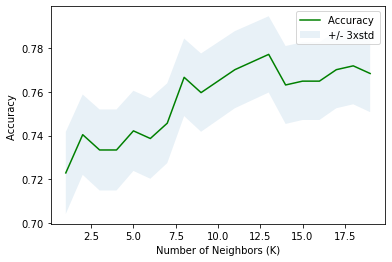

In [15]:
# KNN Generalized 

X = np.asarray(df_DE[['Zipcode', 'Temp','VisibilityMile', 'PrecipInch', ]])


#print(' X ', X[0:5])

y = np.asarray(df_DE['Severity'])

# Fit the model
X = preprocessing.StandardScaler().fit(X).transform(X)  # test version
X[0:1]

# Split train and test sets for model evaluation
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.1, random_state=4)
print ('Shape -Train set:', X_train.shape,  y_train.shape)
print ('Shape -Test set:', X_test.shape,  y_test.shape)

k = 6
# Train Model Predict  
neigh = KNeighborsClassifier(n_neighbors = k).fit(X_train,y_train)
neigh
yhat = neigh.predict(X_test)
yhat[0:100]
from sklearn import metrics
print("Train set Accuracy: ", k,"nn", metrics.accuracy_score(y_train, neigh.predict(X_train)))
print("Test set Accuracy: ", k,"nn", metrics.accuracy_score(y_test, yhat))
print(' Jaccard Score ', jaccard_score(y_test, yhat, average='micro')) #None, 'micro', 'macro', 'weighted'
print("KNN Jaccard index: %.2f" % jaccard_score(y_test, yhat, average='micro'))

k = 7
# Train Model Predict  
neigh = KNeighborsClassifier(n_neighbors = k).fit(X_train,y_train)
neigh
yhat = neigh.predict(X_test)
yhat[0:100]
from sklearn import metrics
print("Train set Accuracy: ", k,"nn", metrics.accuracy_score(y_train, neigh.predict(X_train)))
print("Test set Accuracy: ", k,"nn", metrics.accuracy_score(y_test, yhat))
print(' Jaccard Score ', jaccard_score(y_test, yhat, average='micro')) #None, 'micro', 'macro', 'weighted'
print("KNN Jaccard index: %.2f" % jaccard_score(y_test, yhat, average='micro'))

k = 8
# Train Model Predict  
neigh = KNeighborsClassifier(n_neighbors = k).fit(X_train,y_train)
neigh
yhat = neigh.predict(X_test)
yhat[0:100]
from sklearn import metrics
print("Train set Accuracy: ", k,"nn", metrics.accuracy_score(y_train, neigh.predict(X_train)))
print("Test set Accuracy: ", k,"nn", metrics.accuracy_score(y_test, yhat))
print(' Jaccard Score ', jaccard_score(y_test, yhat, average='micro')) #None, 'micro', 'macro', 'weighted'
print("KNN Jaccard index: %.2f" % jaccard_score(y_test, yhat, average='micro'))

#loop through cross validation parameters to assess
Ks = 20 
mean_acc = np.zeros((Ks-1)) 
std_acc = np.zeros((Ks-1))
k_list = []
nn_list = []

for n in range(1,Ks):
    k_list.append(n)
    #Train Model and Predict  
    neigh = KNeighborsClassifier(n_neighbors = n).fit(X_train,y_train)
    yhat=neigh.predict(X_test)
    mean_acc[n-1] = metrics.accuracy_score(y_test, yhat)
    std_acc[n-1]=np.std(yhat==y_test)/np.sqrt(yhat.shape[0])
    nn_list.append(metrics.accuracy_score(y_test, yhat))

df_accuracy = pd.DataFrame(k_list, nn_list)
df_accuracy.reset_index(inplace=True)
df_accuracy.columns =['Accuracy', 'NN']

   # None, 'micro', 'macro', 'weighted'].

print("KNN Jaccard index: %.2f" % jaccard_score(y_test, yhat, average='micro'))
print("KNN F1-score: %.2f" % f1_score(y_test, yhat, average='micro') )
plt.plot(range(1,Ks),mean_acc,'g')
plt.fill_between(range(1,Ks),mean_acc - 1 * std_acc,mean_acc + 1 * std_acc, alpha=0.10)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Neighbors (K)')
#plt.tight_layout()
df_accuracy
plt.savefig('knn_eval.png')
plt.show()

Train set: (5779, 43) (5779,)
Test set: (3854, 43) (3854,)
Train set Accuracy:  0.9974043952240872
Test set Accuracy:  0.9984431759211209
 Jaccard Score  0.997126097346007
KNN Jaccard index: 0.73
KNN F1-score: 0.74


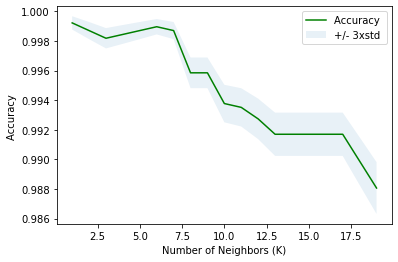

In [16]:
# KNN - Specific overfit

X = features.values  #.astype(float)
X[0:5]

y = features['Severity'].values
y[0:5]

# Fit the model
X = preprocessing.StandardScaler().fit(X).transform(X)  # test version
X[0:1]

# Split train and test sets for model evaluation
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.4, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

k = 4
# Train Model Predict  
neigh = KNeighborsClassifier(n_neighbors = k).fit(X_train,y_train)
neigh
yhat = neigh.predict(X_test)
yhat[0:100]
from sklearn import metrics
print("Train set Accuracy: ", metrics.accuracy_score(y_train, neigh.predict(X_train)))
print("Test set Accuracy: ", metrics.accuracy_score(y_test, yhat))
print(' Jaccard Score ', jaccard_score(y_test, yhat, average='macro')) #None, 'micro', 'macro', 'weighted'
Ks = 20 
mean_acc = np.zeros((Ks-1)) 
std_acc = np.zeros((Ks-1))
k_list = []
nn_list = []

for n in range(1,Ks):
    k_list.append(n)
    #Train Model and Predict  
    neigh = KNeighborsClassifier(n_neighbors = n).fit(X_train,y_train)
    yhat=neigh.predict(X_test)
    mean_acc[n-1] = metrics.accuracy_score(y_test, yhat)
    std_acc[n-1]=np.std(yhat==y_test)/np.sqrt(yhat.shape[0])
    nn_list.append(metrics.accuracy_score(y_test, yhat))

df_accuracy = pd.DataFrame(k_list, nn_list)
df_accuracy.reset_index(inplace=True)
df_accuracy.columns =['Accuracy', 'NN']





   # [None, 'micro', 'macro', 'weighted'].

print("KNN Jaccard index: %.2f" % jaccard_score(y_test, yhat, average='macro'))
print("KNN F1-score: %.2f" % f1_score(y_test, yhat, average='macro') )
plt.plot(range(1,Ks),mean_acc,'g')
plt.fill_between(range(1,Ks),mean_acc - 1 * std_acc,mean_acc + 1 * std_acc, alpha=0.10)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Neighbors (K)')
#plt.tight_layout()
df_accuracy
plt.show()

In [17]:
# Production Decision Tree Generalized featureset

X = np.asarray(df_DE[['Zipcode', 'Temp','VisibilityMile', 'PrecipInch', ]])
#print(' X ', X[0:5])

y = np.asarray(df_DE['Severity'])
#print(' Y ', y[0:5])
print(f"Decision Tree Results\n")

from sklearn import preprocessing
X = preprocessing.StandardScaler().fit(X).transform(X)

X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.1, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

DT_model = DecisionTreeClassifier(criterion="entropy", max_depth = 4)
DT_model.fit(X_train,y_train)
print(DT_model)
yhat = DT_model.predict(X_test)
print("DT Jaccard index: %.2f" % jaccard_score(y_test, yhat, average='weighted'))
print("DT F1-score: %.2f" % f1_score(y_test, yhat, average='weighted') )

Decision Tree Results

Train set: (5165, 4) (5165,)
Test set: (574, 4) (574,)
DecisionTreeClassifier(criterion='entropy', max_depth=4)
DT Jaccard index: 0.63
DT F1-score: 0.73


In [18]:
# 0.5572856596535105
# Production Logistic Regression 
# This featureset is smaller, and contains very generalized indicators. 
# Because the natural fit of the well informed model is excessive, I tried 
# to select features that represent the same information but more "general"
# versions ie: 
#   Zipcode is a wide area location based parameter. (coordinates are very specific)
#   Temp is a loose reference to multiple potential risk enhancers relating to accident severity.
#      There are likely additional ways to tweak these relationships. 
#   Visibility is also relateable to the conditions in the overfit featureset, but in a broad way
#   Rain also

#solver_list = ['liblinear', 'newton-cg', 'lbfgs', 'sag', 'saga']


X = np.asarray(df_DE[['Zipcode', 'Temp','VisibilityMile', 'PrecipInch', ]])
#print(' X ', X[0:5])

y = np.asarray(df_DE['Severity'])
#print(' Y ', y[0:5])

from sklearn import preprocessing
X = preprocessing.StandardScaler().fit(X).transform(X)
#print(' X Fitted ', X[0:5])

X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.4, random_state=0)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

# ### When using newton-cfg, the predictor just picks 2 every time. 
# ### It gets relatively high prediction rates this way, but that is not a good fit. 
# In fact all logistic regreession pointed to a general lack of ability to predict meaningfully, anything.
# Other resolvers faired better, but not much.
# High logloss when using LR to predict with a multi class target is to be expected
# Its presence here is consistent with the conclusion that KNN would be better.

LR = LogisticRegression(C=.04, solver='newton-cg').fit(X_train,y_train)
print(' Logistic Regression Object : ', LR)
ytrue = LR.predict(X_train)
yhat = LR.predict(X_test)
print(' y^ ' , yhat)

yhat_prob = LR.predict_proba(X_test)
#print(' Probability ', yhat_prob)

#None, 'micro', 'macro', 'weighted'

LR_yhat = LR.predict(X_test)
LR_yhat_prob = LR.predict_proba(X_test)
print("LR Jaccard index: %.2f" % jaccard_score(y_test, yhat, average='weighted'))
print("LR F1-score: %.2f" % f1_score(y_test, yhat, average='weighted') )
print("LR LogLoss: %.2f" % log_loss(y_test, yhat_prob))
print(yhat_prob)

Train set: (3443, 4) (3443,)
Test set: (2296, 4) (2296,)
 Logistic Regression Object :  LogisticRegression(C=0.04, solver='newton-cg')
 y^  [2 2 2 ... 2 2 2]
LR Jaccard index: 0.56
LR F1-score: 0.64
LR LogLoss: 0.72
[[0.00222382 0.69544604 0.12104578 0.18128436]
 [0.00164835 0.74050659 0.15113422 0.10671083]
 [0.0019987  0.71028497 0.10960473 0.1781116 ]
 ...
 [0.00113351 0.79137683 0.11376415 0.09372551]
 [0.00171634 0.7241471  0.11718236 0.1569542 ]
 [0.00124993 0.76729872 0.07276009 0.15869126]]


In [19]:
accidents_DE_by_severity.head()

2    4288
4     812
3     629
1      10
Name: Severity, dtype: int64

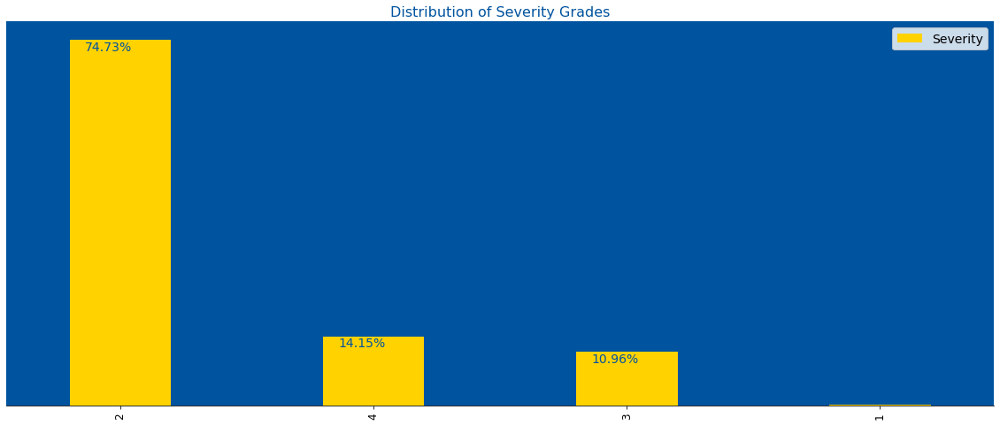

In [20]:
px1 = accidents_DE_by_severity.plot(kind = 'bar',
                figsize = (20,8),
                width = 0.4,
                color = ['#FFD200'],   
                fontsize = '12')
# DE Blue '#00539F'
# DE YELLOW '#FFD200'
# Beautify

px1.set_facecolor('#00539F')
px1.set_title("Distribution of Severity Grades",color ='#00539F',  fontsize = 16)
px1.legend(fontsize = 14)
px1.spines['top'].set_visible(False)
px1.spines['right'].set_visible(False)
px1.spines['left'].set_visible(False)
px1.yaxis.set_visible(False)

# iterate the patches in the plot to annotate them with the percentage accident counts
for i in px1.patches:  
    px1.annotate("{:.2%}".format(i.get_height()/5738),
                xy=(i.get_x()+.06, (i.get_height()-120.2)), fontsize = 14, color='#00539F')
    if (i.get_x(), i.get_height()) == (-0.2, 279) or (i.get_x(), i.get_height()) == (3.8, 1305):
        px1.annotate('(not full year)'.format(i.get_height()), xy=((i.get_x()+.01, i.get_height()+60)), fontsize = 16, color = 'gray')
    #print((i.get_x(), i.get_height()))
    #print(px1.xaxis)
plt.savefig('distribution_severity_grades.png')
plt.show()

In [21]:
solver_list = ['liblinear', 'newton-cg', 'lbfgs', 'sag', 'saga']
parameters = dict(solver=solver_list)
lr = LogisticRegression(random_state=34, multi_class="auto", C=1)
clf = GridSearchCV(lr, parameters, cv=4)
clf.fit(X_train, y_train)
scores = clf.cv_results_['mean_test_score']

for score, solver, in zip(scores, solver_list):
    print(f"{solver}: {score:.3f}")

C:\Users\rb974\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\rb974\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\rb974\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\rb974\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\rb974\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which mean

liblinear: 0.745
newton-cg: 0.745
lbfgs: 0.745
sag: 0.745
saga: 0.745


C:\Users\rb974\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\rb974\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


In [22]:
#

In [23]:
# fit but not accurate. Too generalized
X = np.asarray(df_DE[['Zipcode', 'Temp','VisibilityMile', 'PrecipInch', ]])
print(' X ', X[0:5])

y = np.asarray(df_DE['Severity'])
print(' Y ', y[0:5])

from sklearn import preprocessing
X = preprocessing.StandardScaler().fit(X).transform(X)
#print(' X Fitted ', X[0:5])

X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=0)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)
#print(' X ', X[0:5])
#print(' Y ', y[0:5])

SVM_model = svm.SVC()
SVM_model.fit(X_train, y_train) 
yhat = SVM_model.predict(X_test)
yhat

print("LR Jaccard index: %.2f" % jaccard_score(y_test, yhat, average='micro'))
print("LR F1-score: %.2f" % f1_score(y_test, yhat, average='micro') )

 X  [['19809' 51.1 10.0 0.0]
 ['19720' 46.0 10.0 0.0]
 ['19901' 46.2 10.0 0.0]
 ['19901' 47.7 3.0 0.0]
 ['19943' 65.7 10.0 0.0]]
 Y  [2 2 4 4 4]
Train set: (4591, 4) (4591,)
Test set: (1148, 4) (1148,)
LR Jaccard index: 0.61
LR F1-score: 0.76


In [24]:
# overfit
X = features.values  #.astype(float)
X[0:5]

y = features['Severity'].values
y[0:5]


X = preprocessing.StandardScaler().fit(X).transform(X)
#print(' X Fitted ', X[0:5])

X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2, random_state=0)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)
#print(' X ', X[0:5])
print(' Y ', y[0:5])

SVM_model = svm.SVC()
SVM_model.fit(X_train, y_train) 
yhat = SVM_model.predict(X_test)
yhat

print("LR Jaccard index: %.2f" % jaccard_score(y_test, yhat, average='weighted'))
print("LR F1-score: %.2f" % f1_score(y_test, yhat, average='weighted') )

Train set: (7706, 43) (7706,)
Test set: (1927, 43) (1927,)
 Y  [2 2 4 4 4]
LR Jaccard index: 0.99
LR F1-score: 1.00
